# This colab notebook trains an autoencoder on the pRCC dataset to get the latent features needed for training the WBC model later on.


# Mount drive

In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)



Mounted at /content/drive


# Unzipping dataset into colab instance

In [2]:
!unzip -q '/content/drive/MyDrive/pRCC.zip' -d '/content/'

# Installing required packages


In [3]:
!pip install pytorch_msssim

# Importing things

In [17]:
import os
import torch
from torchvision import transforms
import matplotlib.pyplot as plt
from pytorch_msssim import SSIM
from torch.utils.data import Dataset, DataLoader, ConcatDataset, random_split, Subset
import os
from torchvision.datasets import ImageFolder
from torch import nn, optim
from tqdm.auto import tqdm
import numpy as np

# Parameters


In [18]:
class Config:
    drive_path = "/content/drive/MyDrive"
    datasets_path = f"/content/pRCC"
    weights_path = f"{drive_path}/weights"

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    test_split = 0.2
    validation_split = 0.3

    learning_rate = 0.01
    weight_decay = 1e-4
    grad_clip = 0.1

    pRCC_batch_size = 32
    pRCC_img_resize_target = 512  # from 2000 -> 512 ( Too big to fit on machine!)

config = Config()

# Util functions


In [19]:
# Functions for plotting graphs

def plot_model_stats(experiment, epochs, training_losses, validation_losses):
    fig, axes = plt.subplots(1, 2, figsize=(16, 10))

    # Plot data on each subplot and add labels
    axes[0].plot(epochs, training_losses, marker="o", color="red")
    axes[0].set_title(f'{experiment}: Training Loss vs Epochs')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Training Loss')

    axes[1].plot(epochs, validation_losses, marker="o", color="red")
    axes[1].set_title(f'{experiment}: Validation Loss vs Epochs')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Validation Loss')

    # Add space between subplots
    plt.tight_layout()

    # Show the plot
    plt.show()

    # close it properly
    plt.clf()
    plt.cla()
    plt.close()


# Loss criterion

In [20]:
class SSIMLoss(nn.Module):
    def __init__(self):
        super(SSIMLoss, self).__init__()
        self.ssim = SSIM()

    def forward(self, x, y):
        # Calculate SSIM
        ssim_value = self.ssim(x, y)
        # Subtract SSIM from 1
        loss = 1 - ssim_value
        return loss

# Functions needed for debugging dataset related issues

In [21]:
class LocalDebug:
    @staticmethod
    def create_mini_dataset(dataset, num_samples):
        '''
        Function to be used locally for checking if the model runs or not!

        :param dataset:
        :param num_samples:
        :return:
        '''
        subset_indices = torch.randperm(len(dataset))[:num_samples]
        subset_dataset = Subset(dataset, subset_indices)
        return subset_dataset

    @staticmethod
    def calculate_mean_and_std_of_dataset(dataset):
        '''
        Useful when determining what transforms to set

        :param dataset:
        :return:
        '''
        # dataset =  ImageFolder(root=self.path, transform=transforms.ToTensor())

        # Initialize variables to accumulate mean and standard deviation
        mean = torch.zeros(3)
        std = torch.zeros(3)

        # Loop through the dataset to compute mean and standard deviation
        for img, _ in dataset:
            mean += img.mean(1).mean(1)
            std += img.view(3, -1).std(1)

        # Calculate the mean and standard deviation
        mean /= len(dataset)
        std /= len(dataset)

        return (tuple(mean.tolist()), tuple(std.tolist()))

# Dataset wrapper to move tensors to device

In [22]:
'''
Wrapper on top of dataloader to move tensors to device
'''
class DeviceDataLoader(DataLoader):
    def __init__(self, dataset, batch_size, shuffle=True, device=config.device):
        super().__init__(
            dataset,
            batch_size=batch_size,
            shuffle=shuffle
        )
        self.device = device

    def __iter__(self):
        for batch in super().__iter__():
            yield self._move_to_device(batch)

    def _move_to_device(self, batch):
        if isinstance(batch, torch.Tensor):
            return batch.to(self.device)
        elif isinstance(batch, (list, tuple)):
            return [self._move_to_device(item) for item in batch]
        elif isinstance(batch, dict):
            return {key: self._move_to_device(value) for key, value in batch.items()}
        else:
            return batch



# Dataset


In [29]:
class pRCCDataset:
    def __init__(self, path, batch_size=config.pRCC_batch_size, resize_to=config.pRCC_img_resize_target,
                 test_split=config.test_split, validation_split=config.validation_split):
        # constants
        self.path = path
        self.test_split = test_split
        self.validation_split = validation_split
        self.resize_to = resize_to
        self.batch_size = batch_size
        self.resize_to = resize_to

        # transformations
        self.transforms = [
            # basic transformation
            transforms.Compose([
                transforms.Resize((self.resize_to, self.resize_to)),  # Resize images to a fixed size
                transforms.ToTensor()
            ]),
            # transformation with flips
            transforms.Compose([
                transforms.Resize((self.resize_to, self.resize_to)),
                transforms.RandomHorizontalFlip(),
                transforms.RandomVerticalFlip(),
                transforms.ToTensor()
            ]),
            # transformation with rotation
            transforms.Compose([
                transforms.Resize((self.resize_to, self.resize_to)),
                transforms.RandomRotation(degrees=5),
                transforms.ToTensor()
            ]),
            # transformation with rotation & flips
            transforms.Compose([
                transforms.Resize((self.resize_to, self.resize_to)),
                transforms.RandomRotation(degrees=5),
                transforms.RandomVerticalFlip(),
                transforms.RandomHorizontalFlip(),
                transforms.ToTensor()
            ])
        ]

        self.tensor_to_img_transform = transforms.ToPILImage()

        # create dataset
        self.dataset = self.construct_dataset_with_augmentation()

    def get_dataset(self, transformation):
        '''
        Given a folder with sub folders containing images, get all the images along with applying transformations

        :param inp_path:
        :param transformations:
        :return:
        '''
        image_folder = ImageFolder(root=self.path, transform=transformation)

        # Uncomment for local testing
        # image_folder = LocalDebug.create_mini_dataset(image_folder, 20)

        return image_folder

    def construct_dataset_with_augmentation(self):
        '''

        :return: Concatenated dataset with all augmentations
        '''
        augmentations = []
        for transformation in self.transforms:
            augmentations.append(self.get_dataset(transformation))
        return ConcatDataset(augmentations)

    def get_dataloaders(self):
        '''

        :return: the Train, Val and test dataloaders
        '''
        # Calculate the number of samples to use for validation
        test_dataset, train_dataset, validation_dataset = self.get_split_datasets()

        # Create DataLoaders for validation and test sets
        return DeviceDataLoader(train_dataset, self.batch_size), DeviceDataLoader(test_dataset,
                                                                                  self.batch_size), DeviceDataLoader(
            validation_dataset, self.batch_size)

    def get_split_datasets(self):
        num_total_samples = len(self.dataset)
        # find the no of train samples
        num_test_samples = int(num_total_samples * self.test_split)
        num_train_samples = num_total_samples - num_test_samples
        num_validation_samples = int(num_test_samples * self.validation_split)
        num_test_samples = num_test_samples - num_validation_samples
        # Split the full dataset into train and test sets
        train_dataset, test_dataset, validation_dataset = random_split(self.dataset,
                                                                       [num_train_samples, num_test_samples,
                                                                        num_validation_samples])
        return test_dataset, train_dataset, validation_dataset

    def show_sample_images(self):
        '''
        Show one image from each of the dataloaders

        :return:
        '''
        # Calculate the number of samples to use for validation
        test_dataset, train_dataset, validation_dataset = self.get_split_datasets()

        # create simple dataloaders of batchsize 1
        test_loader = DataLoader(test_dataset, batch_size=1)
        train_loader = DataLoader(train_dataset, batch_size=1)
        validation_loader = DataLoader(validation_dataset, batch_size=1)

        print(f"Showing one image from train_loader")
        self.show_img_from_loader(train_loader)

        print(f"Showing one image from test_loader")
        self.show_img_from_loader(test_loader)

        print(f"Showing one image from validation_loader")
        self.show_img_from_loader(validation_loader)

    def show_img_from_loader(self, loader):
        for data in loader:
            img_tensor, _ = data
            img_tensor = img_tensor.squeeze()
            img = self.tensor_to_img_transform(img_tensor)
            plt.imshow(img)
            plt.axis('off')  # Turn off axis labels and ticks
            plt.show()
            break

# Generic Trainer


In [30]:
class Trainer:
    def __init__(self, name, dataset, model, save_dir, device=config.device):
        '''

        :param name: name of the experiement
        :param dataset: the dataset object which implements the method get_dataloaders()
        :param model: the model architecture used
        :param loss_criterion: the loss function used
        :param save_dir: path where the model weights can be saved
        '''
        self.name = name
        self.dataset = dataset
        self.save_dir = save_dir

        # create the directory if it doesnt exist!
        os.makedirs(self.save_dir, exist_ok=True)
        os.makedirs(os.path.join(self.save_dir, self.name), exist_ok=True)

        self.model = model
        self.device = device
        self.batch_size = self.dataset.batch_size

        # get loaders (each of which already moves tensors to device)
        self.train_loader, self.test_loader, self.val_loader = self.dataset.get_dataloaders()

        # Adam optimizer
        self.optimizer = optim.Adam(self.model.parameters(), lr=config.learning_rate, weight_decay=config.weight_decay)

    # find the most recent file and return the path
    def get_model_checkpoint_path(self, epoch_num=None):
        directory = os.path.join(self.save_dir, self.name)
        if epoch_num == None:
            # Get a list of all files in the directory
            files = os.listdir(directory)

            # Filter out only the files (exclude directories)
            files = [f for f in files if os.path.isfile(os.path.join(directory, f))]

            # Sort the files by their modification time in descending order (most recent first)
            files.sort(key=lambda x: os.path.getmtime(os.path.join(directory, x)), reverse=True)

            # Get the name of the most recently added file
            model_file = files[0] if files else None
        else:
            model_file = f"model_epoch_{epoch_num}.pt"
        return os.path.join(directory, model_file)

    # main train code
    def train(self,
              num_epochs,
              resume_epoch_num=None,
              load_from_checkpoint=False,
              epoch_saver_count=2):
        '''

        :param num_epochs:
        :param resume_epoch_num: just the name of the model checkpoint
        :param load_from_checkpoint: boolean indicating if we need to load from checkpoint or not
        :param epoch_saver_count:
        :return:
        '''
        torch.cuda.empty_cache()

        # initialize the params from the saved checkpoint
        self.init_params_from_checkpoint_hook(load_from_checkpoint, resume_epoch_num)

        # set up scheduler
        self.init_scheduler_hook(num_epochs)

        # Custom progress bar for total epochs with color and displaying average epoch loss
        total_progress_bar = tqdm(
            total=num_epochs, desc=f"Total Epochs", position=0,
            bar_format="{desc}: {percentage}% |{bar}| {n_fmt}/{total_fmt} [{elapsed}<{remaining}, {rate_fmt}]",
            dynamic_ncols=True, ncols=100, colour='red'
        )

        # Train loop
        for epoch in range(self.start_epoch, self.start_epoch + num_epochs):
            # Custom progress bar for each epoch with color
            epoch_progress_bar = tqdm(
                total=len(self.train_loader),
                desc=f"Epoch {epoch + 1}/{self.start_epoch + num_epochs}",
                position=1,
                leave=False,
                dynamic_ncols=True,
                ncols=100,
                colour='green'
            )

            # set model to train mode
            self.model.train()

            # set the epoch training loss
            epoch_training_loss = 0.0

            # iterate over each batch
            for batch_idx, data in enumerate(self.train_loader):
                loss = self.calculate_loss_hook(data)
                loss.backward()

                # Gradient clipping
                nn.utils.clip_grad_value_(self.model.parameters(), config.grad_clip)

                self.optimizer.step()
                self.optimizer.zero_grad()

                # scheduler update
                if self.scheduler:
                    self.scheduler.step()

                # add to epoch loss
                epoch_training_loss += loss.item()

                # Update the epoch progress bar (overwrite in place)
                postfix = {
                    "loss": loss.item()
                }

                # e.g. computes things like accuracy
                batch_stats = self.calculate_train_batch_stats_hook()

                postfix.update(batch_stats)

                epoch_progress_bar.set_postfix(postfix)
                epoch_progress_bar.update(1)

            # close the epoch progress bar
            epoch_progress_bar.close()

            # calculate average epoch train statistics
            avg_train_stats = self.calculate_avg_train_stats_hook(epoch_training_loss)

            # calculate validation statistics
            avg_val_stats = self.validation_hook()

            # Store running history
            self.store_running_history_hook(epoch, avg_train_stats, avg_val_stats)

            # Show epoch stats (NOTE: Can clear the batch stats here)
            print(f"# Epoch {epoch+1}")
            epoch_postfix = self.calculate_and_print_epoch_stats_hook(avg_train_stats, avg_val_stats)


            # Update the total progress bar
            total_progress_bar.set_postfix(epoch_postfix)

            # Close tqdm bar
            total_progress_bar.update(1)

            # Save model checkpoint periodically
            need_to_save_model_checkpoint = (epoch + 1) % epoch_saver_count == 0
            if need_to_save_model_checkpoint:
                print(f"Going to save model {self.name} @ Epoch:{epoch + 1}")
                self.save_model_checkpoint_hook(epoch, avg_train_stats, avg_val_stats)

            print("-" * 60)

        # Close the total progress bar
        total_progress_bar.close()

        # Return the current state
        return self.get_current_running_history_state_hook()

    # hooks
    def init_params_from_checkpoint_hook(self, load_from_checkpoint, resume_checkpoint):
        raise NotImplementedError("Need to implement hook for initializing params from checkpoint")

    def init_scheduler_hook(self, num_epochs):
        # optimizer is already defined in the super class constructor at this point
        self.scheduler = torch.optim.lr_scheduler.OneCycleLR(
            self.optimizer,
            config.learning_rate,
            epochs=num_epochs,
            steps_per_epoch=len(self.train_loader)
        )
    def calculate_loss_hook(self, data):
        raise NotImplementedError("Need to implement hook for computing the custom loss value")

    def calculate_train_batch_stats_hook(self):
        raise NotImplementedError("Need to implement this hook for computing the batch statistics like accuracy")

    def calculate_avg_train_stats_hook(self):
        raise NotImplementedError(
            "Need to implement this hook for calculating train loss and train accuracy if applicable")

    def validation_hook(self):
        raise NotImplementedError("Need to implement this hook to calculate the validation stats")

    def calculate_and_print_epoch_stats_hook(self):
        raise NotImplementedError(
            "Need to implement this hook to calculate and print the epoch statistics and return the postfix dictinoary")

    def store_running_history_hook(self, epoch, avg_train_stats, avg_val_stats):
        raise NotImplementedError("Need to implement this hook to store the running history of stats for each epoch")

    def save_model_checkpoint_hook(self, epoch, avg_train_stats, avg_val_stats):
        raise NotImplementedError("Need to implement this hook to save the model checkpoints")

    def get_current_running_history_state_hook(self):
        raise NotImplementedError("Need to implement this hook to return the history after training the model")


# pRCC Trainer

In [31]:
class pRCCTrainer(Trainer):
    def __init__(self, name, dataset, model, save_dir):
        super().__init__(name, dataset, model, save_dir)

        # structured similarity index
        self.loss_criterion = SSIMLoss()

        # L2 Loss
        # self.loss_criterion = nn.MSELoss()

        # Values which can change based on loaded checkpoint
        self.start_epoch = 0
        self.epoch_numbers = []
        self.training_losses = []
        self.validation_losses = []

        # Loaders to show reconstruction
        self.test_loader_sampler = DeviceDataLoader(self.test_loader.dataset, batch_size=1)
        self.val_loader_sampler = DeviceDataLoader(self.val_loader.dataset, batch_size=1)

        self.tensor_to_img_transform = transforms.ToPILImage()


    # hooks
    def init_params_from_checkpoint_hook(self, load_from_checkpoint, resume_epoch_num):
        if load_from_checkpoint:
            # NOTE: resume_epoch_num can be None here if we want to load from the most recently saved checkpoint!
            checkpoint_path = self.get_model_checkpoint_path(resume_epoch_num)
            checkpoint = torch.load(checkpoint_path)

            # load previous state
            self.model.load_state_dict(checkpoint['model_state_dict'])
            self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

            # Things we are keeping track of
            self.start_epoch = checkpoint['epoch']
            self.epoch_numbers = checkpoint['epoch_numbers']
            self.training_losses = checkpoint['training_losses']
            self.validation_losses = checkpoint['validation_losses']

            print(f"Model checkpoint for {self.name} is loaded from {checkpoint_path}!")

    def calculate_loss_hook(self, data):
        images, _ = data
        latent_encoding, predictions = self.model(images)
        loss = self.loss_criterion(images, predictions)
        return loss

    def calculate_train_batch_stats_hook(self):
        # Note: No accuracy to compute so leaving it as is.
        return dict()

    def calculate_avg_train_stats_hook(self, epoch_training_loss):
        # NOTE: no need to calculate avg training accuracy here
        avg_training_loss_for_epoch = epoch_training_loss / len(self.train_loader)
        return {
            "avg_training_loss": avg_training_loss_for_epoch
        }

    def validation_hook(self):
        '''
        :return: avg val loss for that epoch
        '''
        val_loss = 0.0

        # set to eval mode
        self.model.eval()

        with torch.no_grad():
            for val_batch_idx, val_data in enumerate(self.val_loader):
                val_images, _ = val_data
                _, val_predictions = self.model(val_images)

                val_loss += self.loss_criterion(val_images, val_predictions).item()

        # Calculate average validation loss for the epoch
        avg_val_loss_for_epoch = val_loss / len(self.val_loader)

        # show some sample predictions
        self.show_sample_reconstructions(self.val_loader_sampler)

        return {
            "avg_val_loss_for_epoch": avg_val_loss_for_epoch
        }

    def store_running_history_hook(self, epoch, avg_train_stats, avg_val_stats):
        self.epoch_numbers.append(epoch + 1)
        self.training_losses.append(avg_train_stats["avg_training_loss"])
        self.validation_losses.append(avg_val_stats["avg_val_loss_for_epoch"])

    def calculate_and_print_epoch_stats_hook(self, avg_train_stats, avg_val_stats):
        print(
            f"Epoch loss: {avg_train_stats['avg_training_loss']} | Val loss: {avg_val_stats['avg_val_loss_for_epoch']}")
        return {
            "epoch_loss": avg_train_stats["avg_training_loss"],
            "val_loss": avg_val_stats["avg_val_loss_for_epoch"]
        }

    def save_model_checkpoint_hook(self, epoch, avg_train_stats, avg_val_stats):
        # set it to train mode to save the weights (but doesn't matter apparently!)
        self.model.train()

        # create the directory if it doesn't exist
        model_save_directory = os.path.join(self.save_dir, self.name)
        os.makedirs(model_save_directory, exist_ok=True)

        # Checkpoint the model at the end of each epoch
        checkpoint_path = os.path.join(model_save_directory, f'model_epoch_{epoch + 1}.pt')
        torch.save(
            {
                'model_state_dict': self.model.state_dict(),
                'optimizer_state_dict': self.optimizer.state_dict(),
                'epoch': epoch + 1,
                'epoch_numbers': self.epoch_numbers,
                'training_losses': self.training_losses,
                'validation_losses': self.validation_losses
            },
            checkpoint_path
        )
        print(f"Saved the model checkpoint for experiment {self.name} for epoch {epoch + 1}")

    def get_current_running_history_state_hook(self):
        return self.epoch_numbers, self.training_losses, self.validation_losses

    # test code
    def test_model(self):
        test_loss = 0.0

        # set to eval mode
        self.model.eval()

        with torch.no_grad():
            for val_batch_idx, val_data in enumerate(self.test_loader):
                test_images, _ = val_data
                _, test_predictions = self.model(test_images)

                test_loss += self.loss_criterion(test_images, test_predictions).item()

        # Calculate average validation loss for the epoch
        avg_test_loss = test_loss / len(self.test_loader)

        # show some sample predictions
        self.show_sample_reconstructions(self.test_loader_sampler)

        return {
            "avg_test_loss": avg_test_loss
        }

    # util code
    def show_sample_reconstructions(self, dataloader):
        self.model.eval()

        # Create a subplot grid
        fig, axes = plt.subplots(1, 2, figsize=(9, 9))

        with torch.no_grad():
            for val_data in dataloader:
                sample_image, _ = val_data

                # Forward pass through the model
                _, predicted_image = self.model(sample_image)

                # squeeze it
                sample_image = sample_image.squeeze().to("cpu")
                predicted_image = predicted_image.squeeze().to("cpu")

                #convert to PIL Image
                sample_image = self.tensor_to_img_transform(sample_image)
                predicted_image = self.tensor_to_img_transform(predicted_image)

                axes[0].imshow(sample_image)
                axes[0].set_title(f"Sample Original Image", color='green')
                axes[0].axis('off')

                axes[1].imshow(predicted_image)
                axes[1].set_title(f"Sample Reconstructed Image", color='red')
                axes[1].axis('off')

                #show only one image
                break

        plt.tight_layout()
        plt.show()

# Model


In [32]:
class pRCCAutoencoder(nn.Module):
    def __init__(self):
        super().__init__()


        # Encoder
        self.encoder_conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1).to(config.device)
        self.encoder_conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1).to(config.device)
        self.encoder_conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1).to(config.device)
        # self.encoder_conv1 = nn.Conv2d(3, 32, kernel_size=4, stride=2, padding=1).to(config.device)
        # self.encoder_conv2 = nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1).to(config.device)
        # self.encoder_conv3 = nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1).to(config.device)

        # Decoder
        self.decoder_conv3 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2).to(config.device)
        self.decoder_conv2 = nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2).to(config.device)
        self.decoder_conv1 = nn.ConvTranspose2d(32, 3, kernel_size=2, stride=2).to(config.device)

        #Maxpool
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2).to(config.device)

        #Batch norms
        self.bn3 = nn.BatchNorm2d(3).to(config.device)
        self.bn32 = nn.BatchNorm2d(32).to(config.device)
        self.bn64 = nn.BatchNorm2d(64).to(config.device)
        self.bn128 = nn.BatchNorm2d(128).to(config.device)
        self.bn256 = nn.BatchNorm2d(256).to(config.device)

        #Activation
        self.relu = nn.ReLU().to(config.device)
        self.sigmoid = nn.Sigmoid().to(config.device)

    def forward(self, x):
        # Encoding
        x1_enc = self.encoder_conv1(x)# Shape: (batch_size, 32, 512, 512)
        # x1_enc = self.bn32(x1_enc)
        x1_enc = self.relu(x1_enc)
        x1_enc = self.maxpool(x1_enc) #Shape: (b, 32,256,256)

        x2_enc = self.encoder_conv2(x1_enc)  # Shape: (batch_size, 64, 256, 256)
        # x2_enc = self.bn64(x2_enc)
        x2_enc = self.relu(x2_enc)
        x2_enc = self.maxpool(x2_enc) # Shape: (batch_size, 64, 128, 128)

        x3_enc = self.encoder_conv3(x2_enc)  # Shape: (batch_size, 128, 128, 128)
        # x3_enc = self.bn128(x3_enc)
        x3_enc = self.relu(x3_enc)
        x3_enc = self.maxpool(x3_enc) # Shape: (batch_size, 128, 64, 64)


        # Decoding
        x3_dec = self.decoder_conv3(x3_enc)  # Shape: (batch_size, 64, 128, 128)
        # x5_dec = self.bn256(x5_dec)
        x3_dec = self.relu(x3_dec)

        x2_dec = self.decoder_conv2(x3_dec)  # Shape: (batch_size, 32, 256, 256)
        # x4_dec = self.bn128(x4_dec)
        x2_dec = self.relu(x2_dec)

        x1_dec = self.decoder_conv1(x2_dec)  # Shape: (batch_size, 3, 512, 512)
        # x1_dec = self.bn3(x1_dec)
        x1_dec = self.sigmoid(x1_dec)

        return x3_enc, x1_dec

# Creating the dataset

In [33]:
path = os.path.abspath(config.datasets_path)
pRCC_dataset = pRCCDataset(path)

# Training code

In [34]:
name = "pRCC_Autoencoder"
model = pRCCAutoencoder().to(config.device)
save_dir = os.path.abspath(config.weights_path)
pRCC_module = pRCCTrainer(name, pRCC_dataset, model, save_dir)

Total Epochs: 0.0% |          | 0/20 [00:00<?, ?it/s]

Epoch 1/20:   0%|          | 0/142 [00:00<?, ?it/s]

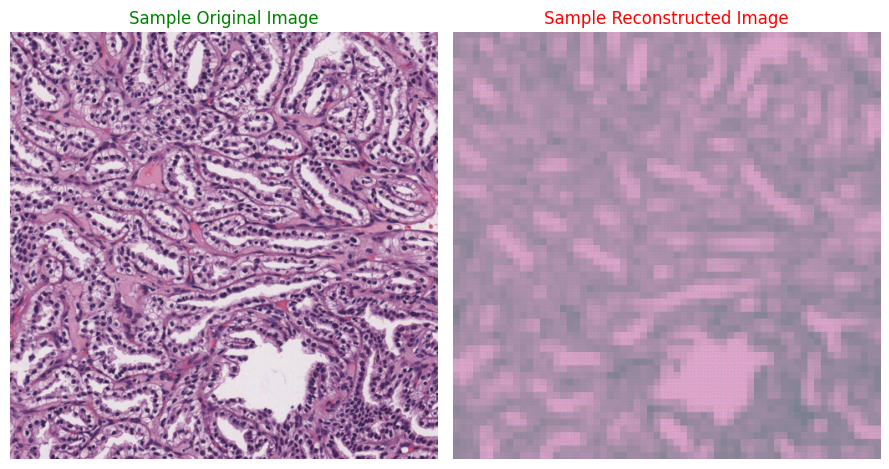

# Epoch 1
Epoch loss: 0.005374126451116213 | Val loss: 0.003474051302129572
------------------------------------------------------------


Epoch 2/20:   0%|          | 0/142 [00:00<?, ?it/s]

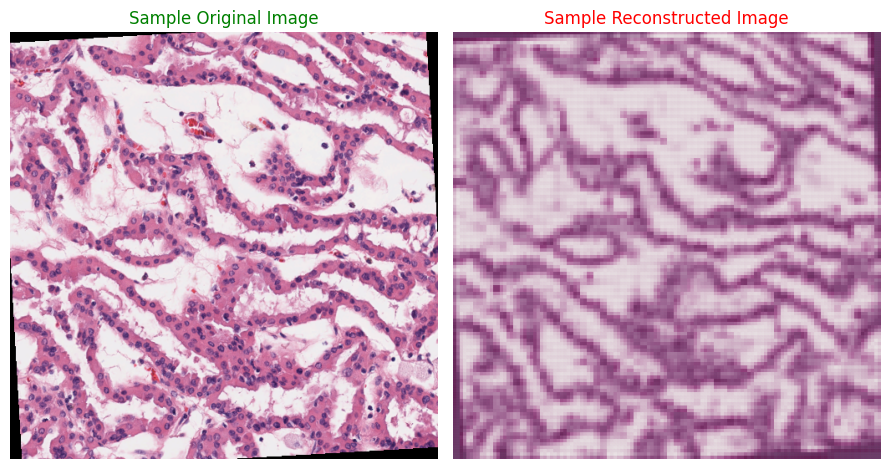

# Epoch 2
Epoch loss: 0.0020450194117049097 | Val loss: 0.0013596415519714355
Going to save model pRCC_Autoencoder @ Epoch:2
Saved the model checkpoint for experiment pRCC_Autoencoder for epoch 2
------------------------------------------------------------


Epoch 3/20:   0%|          | 0/142 [00:00<?, ?it/s]

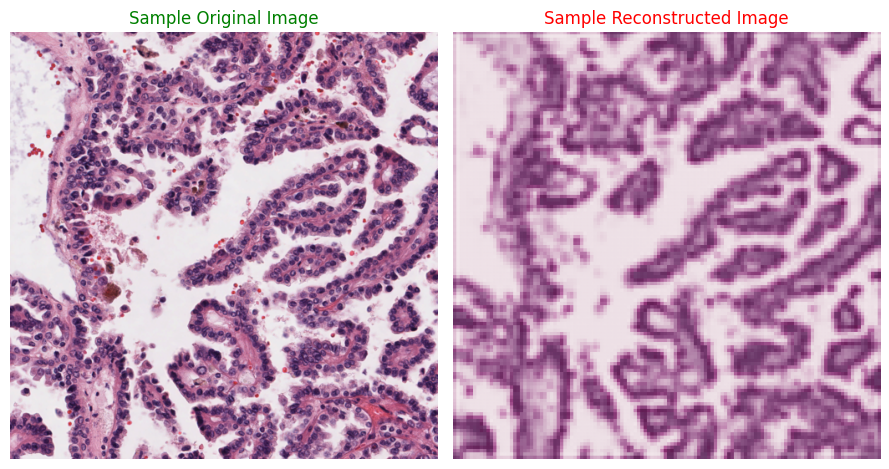

# Epoch 3
Epoch loss: 0.0012902949057834248 | Val loss: 0.0010759396986527877
------------------------------------------------------------


Epoch 4/20:   0%|          | 0/142 [00:00<?, ?it/s]

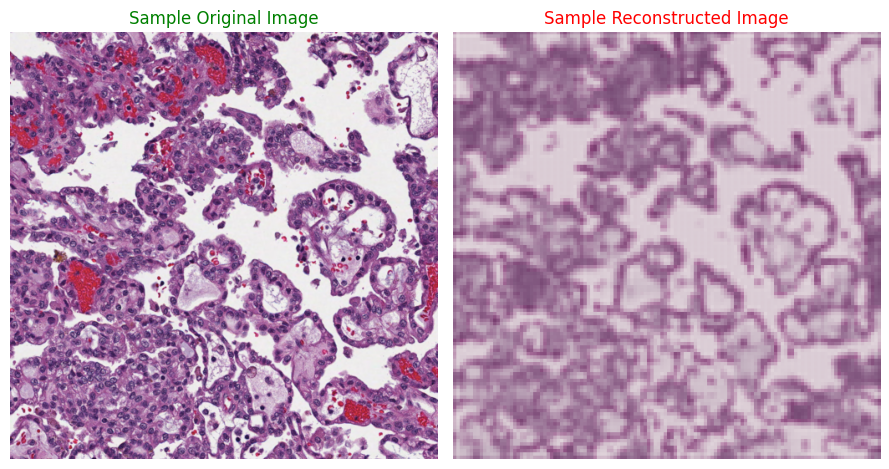

# Epoch 4
Epoch loss: 0.0013191733561771016 | Val loss: 0.0018174268982627175
Going to save model pRCC_Autoencoder @ Epoch:4
Saved the model checkpoint for experiment pRCC_Autoencoder for epoch 4
------------------------------------------------------------


Epoch 5/20:   0%|          | 0/142 [00:00<?, ?it/s]

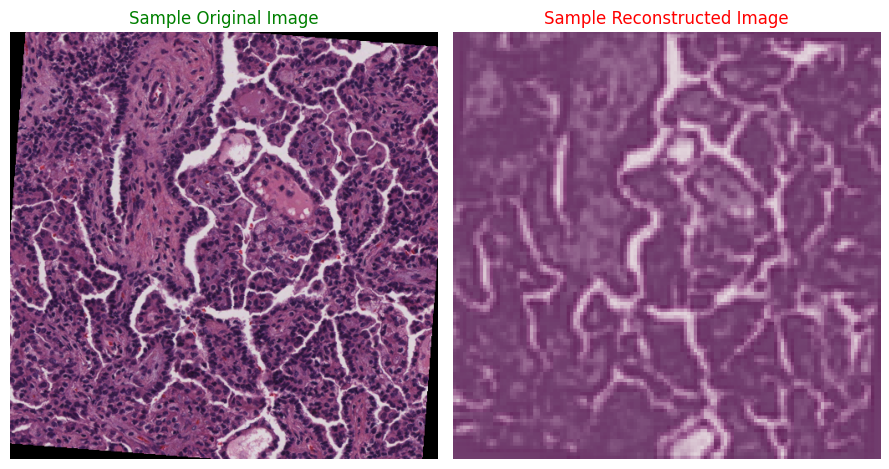

# Epoch 5
Epoch loss: 0.0014497939969452334 | Val loss: 0.0011169747872786088
------------------------------------------------------------


Epoch 6/20:   0%|          | 0/142 [00:00<?, ?it/s]

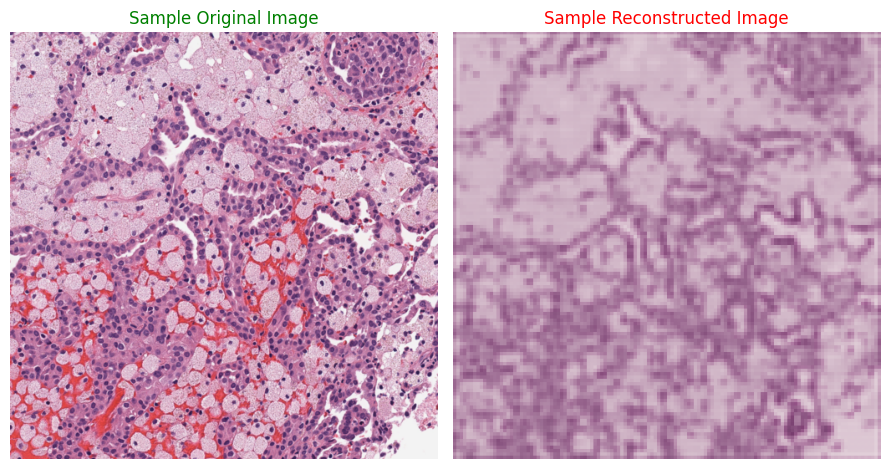

# Epoch 6
Epoch loss: 0.001337350674078498 | Val loss: 0.0012841658158735795
Going to save model pRCC_Autoencoder @ Epoch:6
Saved the model checkpoint for experiment pRCC_Autoencoder for epoch 6
------------------------------------------------------------


Epoch 7/20:   0%|          | 0/142 [00:00<?, ?it/s]

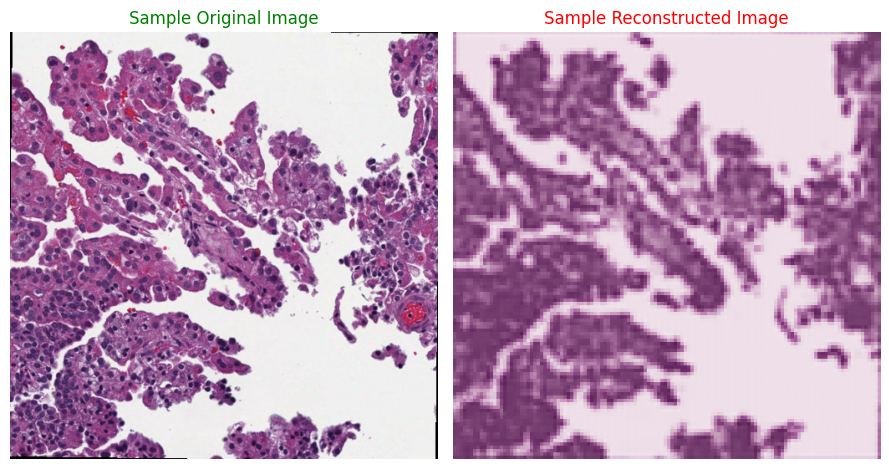

# Epoch 7
Epoch loss: 0.0012693627619407546 | Val loss: 0.001094796440818093
------------------------------------------------------------


Epoch 8/20:   0%|          | 0/142 [00:00<?, ?it/s]

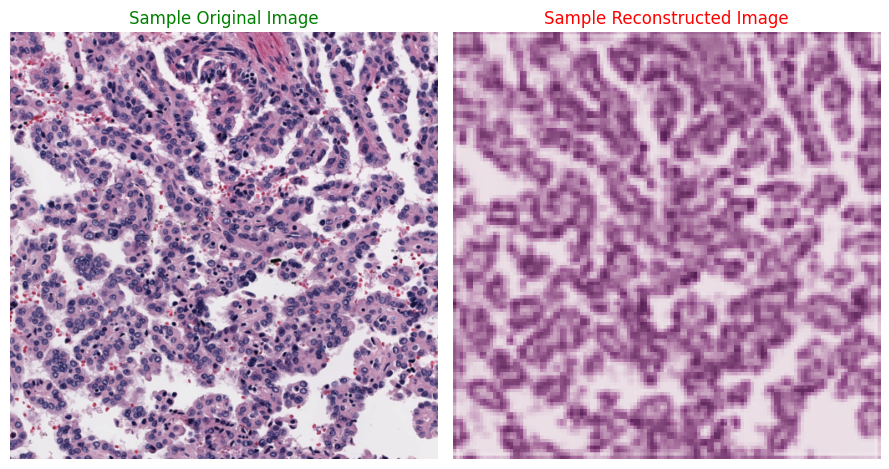

# Epoch 8
Epoch loss: 0.0011439050587130264 | Val loss: 0.0010144981470975008
Going to save model pRCC_Autoencoder @ Epoch:8
Saved the model checkpoint for experiment pRCC_Autoencoder for epoch 8
------------------------------------------------------------


Epoch 9/20:   0%|          | 0/142 [00:00<?, ?it/s]

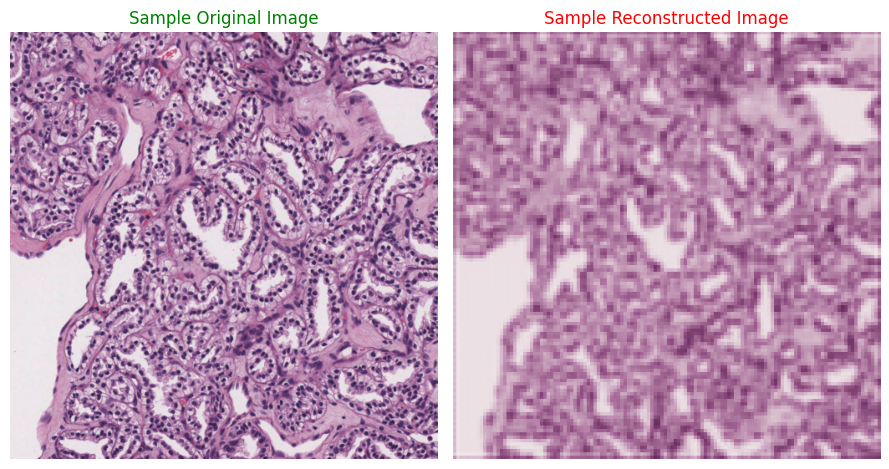

# Epoch 9
Epoch loss: 0.0012261930485846291 | Val loss: 0.0010279525410045278
------------------------------------------------------------


Epoch 10/20:   0%|          | 0/142 [00:00<?, ?it/s]

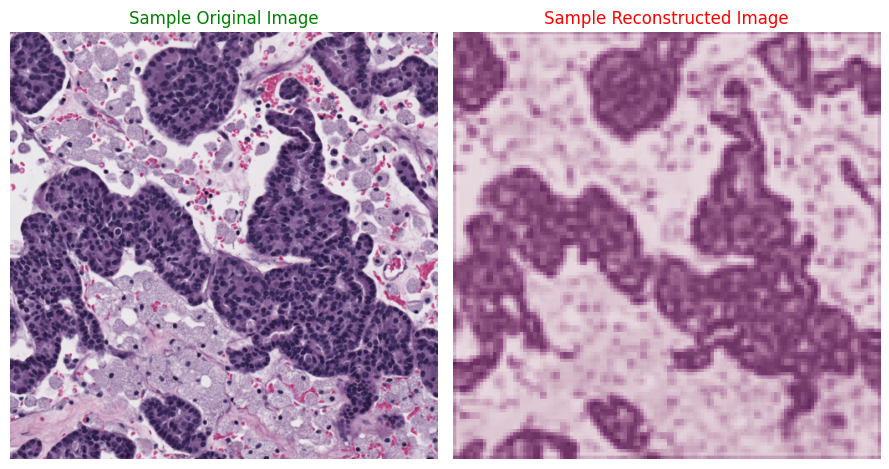

# Epoch 10
Epoch loss: 0.0010795400176249758 | Val loss: 0.001695074818351052
Going to save model pRCC_Autoencoder @ Epoch:10
Saved the model checkpoint for experiment pRCC_Autoencoder for epoch 10
------------------------------------------------------------


Epoch 11/20:   0%|          | 0/142 [00:00<?, ?it/s]

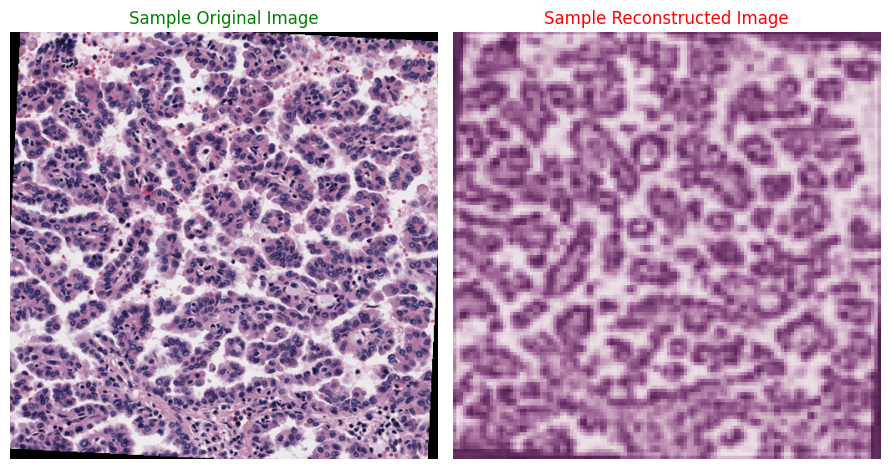

# Epoch 11
Epoch loss: 0.0011135478254774927 | Val loss: 0.0009675134312022816
------------------------------------------------------------


Epoch 12/20:   0%|          | 0/142 [00:00<?, ?it/s]

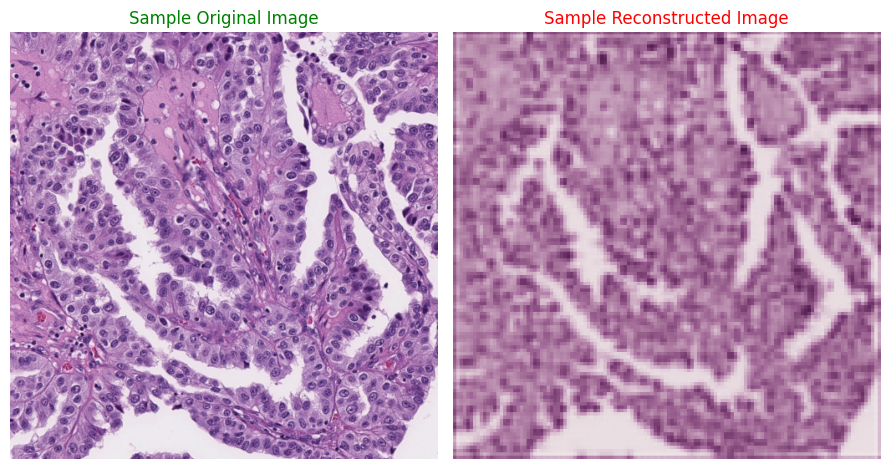

# Epoch 12
Epoch loss: 0.0009684667620860355 | Val loss: 0.000967551361430775
Going to save model pRCC_Autoencoder @ Epoch:12
Saved the model checkpoint for experiment pRCC_Autoencoder for epoch 12
------------------------------------------------------------


Epoch 13/20:   0%|          | 0/142 [00:00<?, ?it/s]

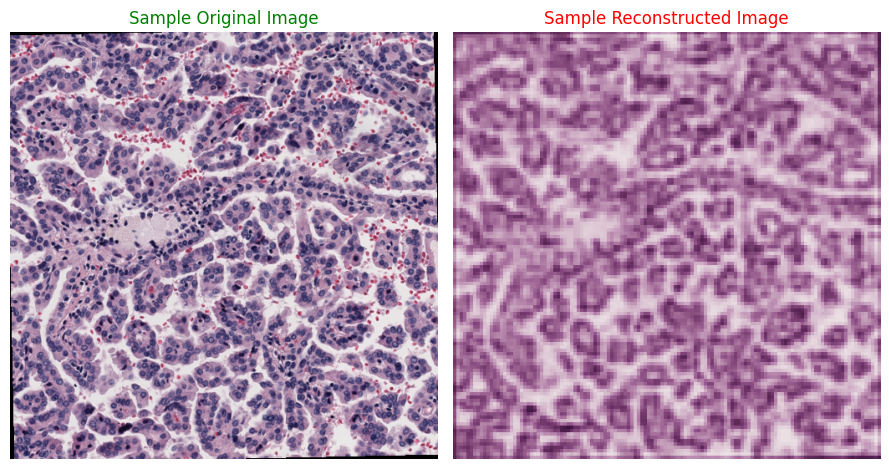

# Epoch 13
Epoch loss: 0.0009591440919419409 | Val loss: 0.000939488410949707
------------------------------------------------------------


Epoch 14/20:   0%|          | 0/142 [00:00<?, ?it/s]

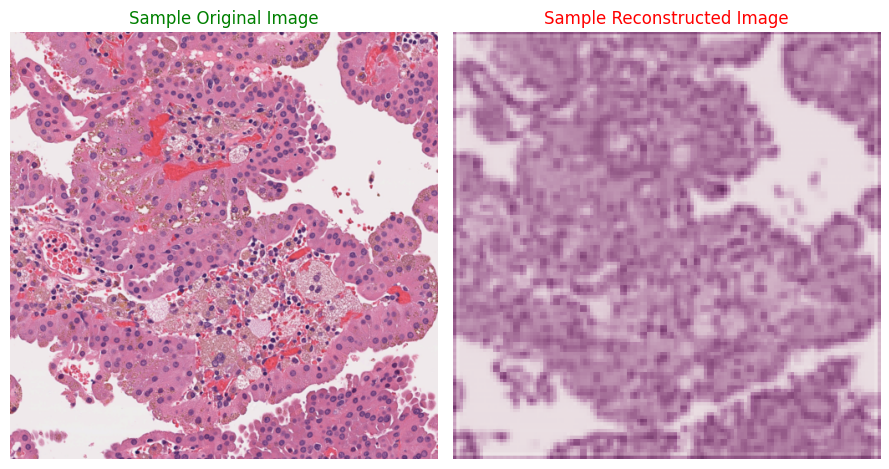

# Epoch 14
Epoch loss: 0.0009518261526671934 | Val loss: 0.0009643489664251155
Going to save model pRCC_Autoencoder @ Epoch:14
Saved the model checkpoint for experiment pRCC_Autoencoder for epoch 14
------------------------------------------------------------


Epoch 15/20:   0%|          | 0/142 [00:00<?, ?it/s]

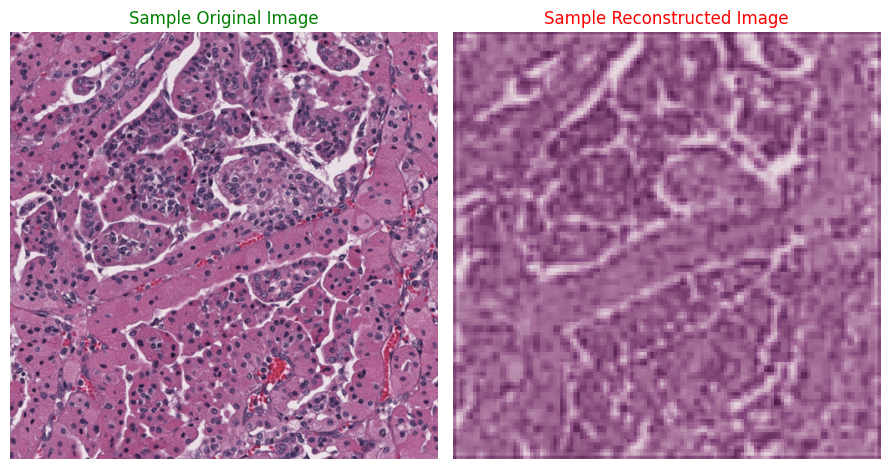

# Epoch 15
Epoch loss: 0.0009439289569854736 | Val loss: 0.0009428208524530584
------------------------------------------------------------


Epoch 16/20:   0%|          | 0/142 [00:00<?, ?it/s]

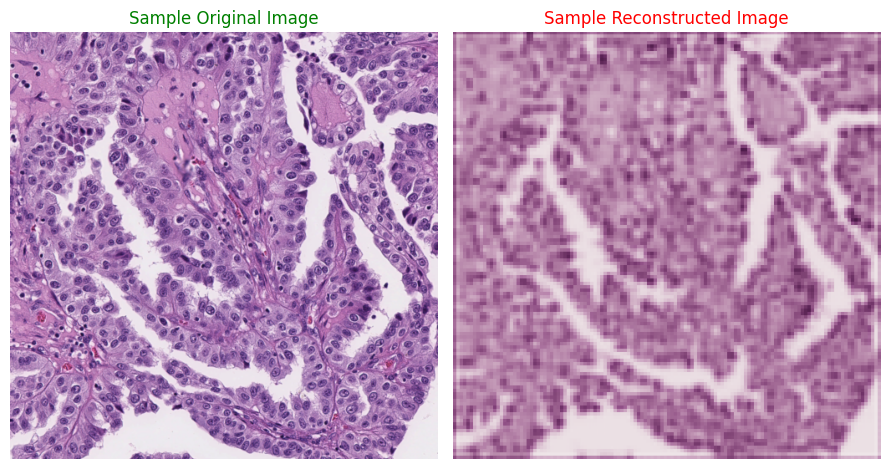

# Epoch 16
Epoch loss: 0.0009358101327654342 | Val loss: 0.0009278384121981534
Going to save model pRCC_Autoencoder @ Epoch:16
Saved the model checkpoint for experiment pRCC_Autoencoder for epoch 16
------------------------------------------------------------


Epoch 17/20:   0%|          | 0/142 [00:00<?, ?it/s]

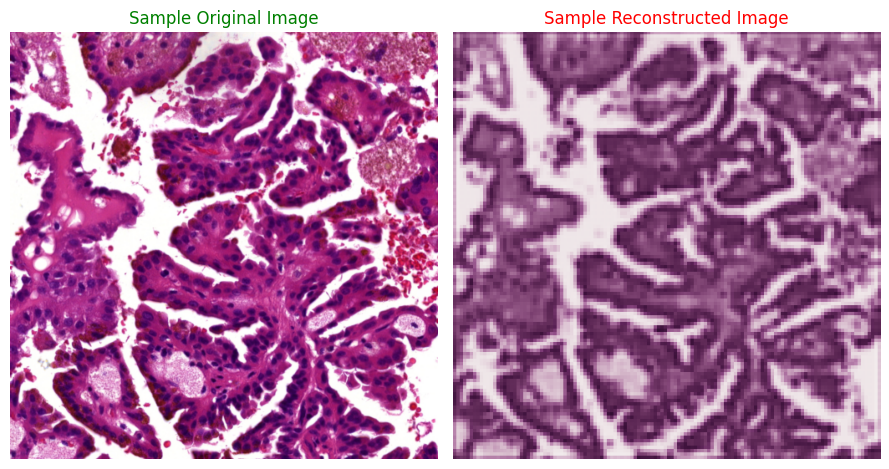

# Epoch 17
Epoch loss: 0.0009318523004021443 | Val loss: 0.0009296319701454856
------------------------------------------------------------


Epoch 18/20:   0%|          | 0/142 [00:00<?, ?it/s]

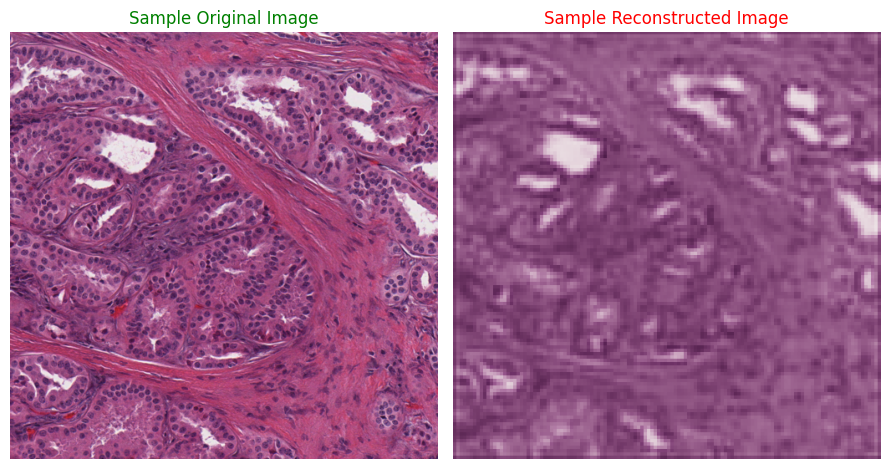

# Epoch 18
Epoch loss: 0.0009295147069742982 | Val loss: 0.0009237040172923695
Going to save model pRCC_Autoencoder @ Epoch:18
Saved the model checkpoint for experiment pRCC_Autoencoder for epoch 18
------------------------------------------------------------


Epoch 19/20:   0%|          | 0/142 [00:00<?, ?it/s]

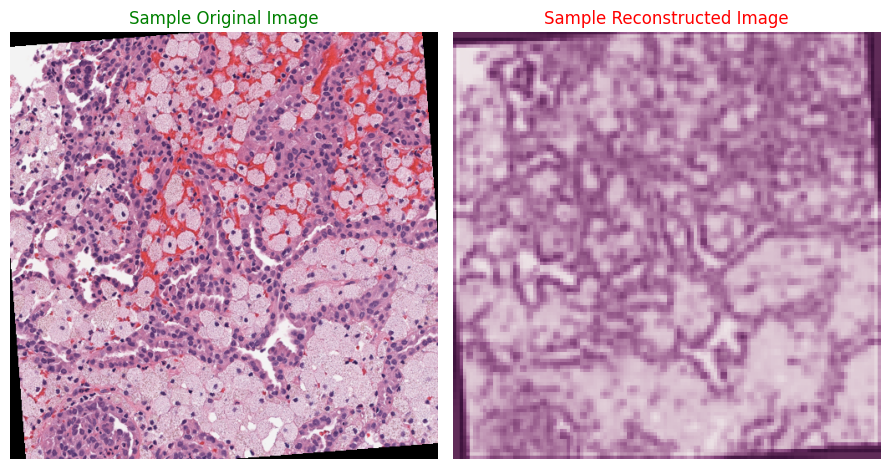

# Epoch 19
Epoch loss: 0.0009290773264119323 | Val loss: 0.0009232055057178844
------------------------------------------------------------


Epoch 20/20:   0%|          | 0/142 [00:00<?, ?it/s]

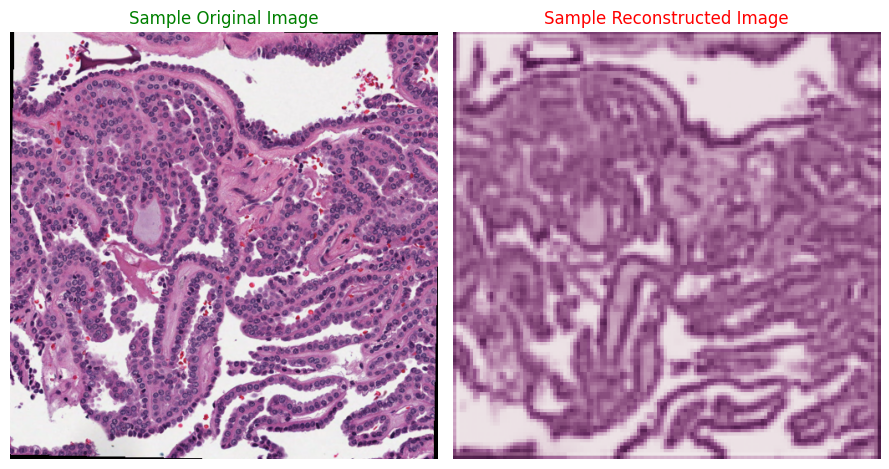

# Epoch 20
Epoch loss: 0.0009286025880088269 | Val loss: 0.0009268251332369717
Going to save model pRCC_Autoencoder @ Epoch:20
Saved the model checkpoint for experiment pRCC_Autoencoder for epoch 20
------------------------------------------------------------


In [35]:
epoch_numbers, training_losses, validation_losses = pRCC_module.train(20, epoch_saver_count=2)

## Training for more epochs if required

In [ ]:
# epoch_numbers, training_losses, validation_losses = pRCC_module.train(20, epoch_saver_count=2, load_from_checkpoint=True, resume_epoch_num=6)

# Testing the model

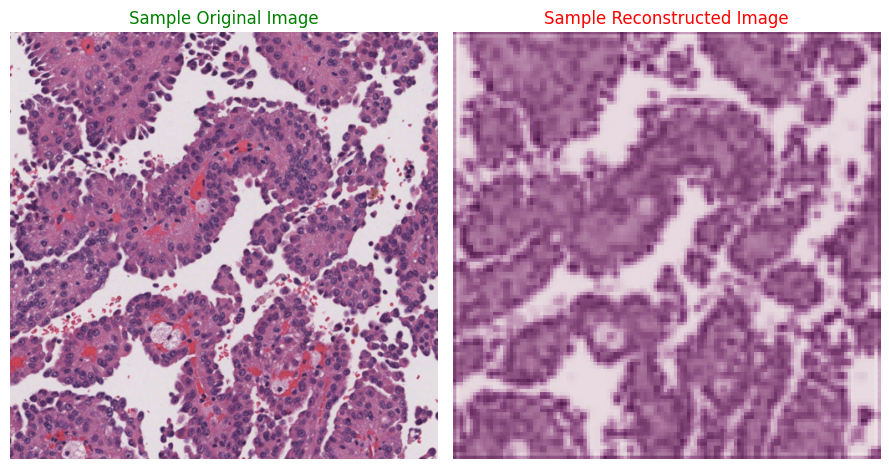

In [36]:
test_stats = pRCC_module.test_model()

In [37]:
test_stats

{'avg_test_loss': 0.0009320855140686035}

# Plotting the graphs

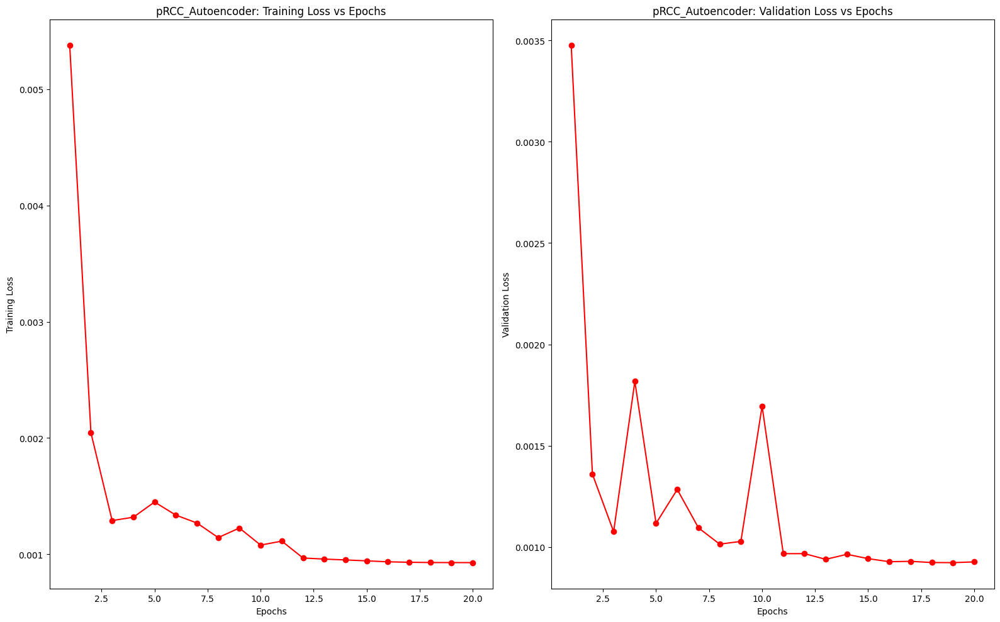

In [38]:
plot_model_stats(name, epoch_numbers, training_losses, validation_losses)